## **7.2 Google Colab algoritmos de extracción de características**

Los ejercicios que deben agregarse a este proyecto serán las siguientes:

En esta actividad se implementarán algunos algoritmos básicos de extracción de características, tales como Harris, SIFT y SURF, los cuales son usados para la extracción de puntos de interés o puntos distintivos. Estas características son sumamente importantes en muchas aplicaciones de visión computacional, tales como la creación de panoramas, el rastreo de objetos en robótica y la reconstrucción 3D, por mencionar algunos casos de uso. En muchas de estas aplicaciones, el encontrar correspondencias entre dos imágenes consecutivas es importante para establecer el principio de funcionamiento del método, por lo que en esta actividad compararemos el desempeño de estos tres métodos en esta tarea fundamental, y analizaremos las ventajas y desventajas de cada uno de ellos.  

**Ingresar a Canvas y descargar los siguientes notebooks:**

-Harris NotebookDownload Harris Notebook

-Matching NotebookDownload Matching Notebook

Revisar los ejercicios propuestos antes de codificar e identificar las secciones de libro o de las slides que te puedan servir como soporte.
En esta semana se solicitan realizar los siguientes experimentos

a) En el Collab de Harris Detector, se sugiere que se hagan pruebas con imágenes propias que el equipo decida usar. La idea  es escoger un objeto y tomar fotos con diferentes tipos de iluminación (bajo el sol, en un lugar oscuro) y bajo diferentes ángulos para analizar el comportamiento del detector de Harris bajo diferentes settings

b) En cuanto al Collab de matching, no se espera tampoco que se haga ninguna modificación al código, pero la idea es probar que tan buenos son los diferentes descriptores para hacer matching de imagenes. Se sugiere usar las imágenes con variaciones de iluminación y orientación y ver que tan bien se hace el matching con Harris por si mismo, o con otros descriptores como SIFT u ORB. Discuta sus hallazgos



# **Names and IDs of team members:**

**Nombre Matrícula**

Félix Daniel Reyes López A01794458

Dante Cesar Cervantes Gutierrez A01794585

Ruben Guerrero del Fierro A01793005

Juan Manuel Carballo Montaño A01166758


## Importing Libraries <a class="anchor" id="libraries" ></a>

In [272]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [273]:

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [274]:
import os
DIR = "/content/drive/MyDrive/Colab Notebooks/MNA/ComputerVision/Activities/7.2"
os.chdir(DIR)

#Image Matching

## Table of Contents
1. [Libraries](#libraries)
1. [ORB Matching](#orb)
1. [SIFT Matching](#sift)

# ORB (Oriented FAST and Rotated BRIEF) <a class="anchor" id="orb" ></a>

- Developed at OpenCV labs by Ethan Rublee, Vincent Rabaud, Kurt Konolige, and Gary R. Bradski in 2011
- Efficient and viable alternative to SIFT and SURF (patented algorithms)
- ORB is free to use
- Feature detection
- ORB builds on FAST keypoint detector + BRIEF descriptor

## **Introduccion:**

ORB es una fusión del detector de puntos clave FAST y el descriptor BRIEF con algunas características adicionales para mejorar el rendimiento. FAST son características de la prueba de segmento acelerada que se utilizan para detectar características de la imagen proporcionada. También utiliza una pirámide para producir funciones multiescala. Ahora no calcula la orientación ni los descriptores de las características, por lo que aquí es donde BRIEF entra en juego.

ORB utiliza descriptores BRIEF, pero BRIEF funciona mal con la rotación. Entonces, lo que hace ORB es rotar el BRIEF según la orientación de los puntos clave. Usando la orientación del parche, se encuentra su matriz de rotación y gira el BRIEF para obtener la versión rotada. ORB es una alternativa eficiente a los algoritmos SIFT o SURF utilizados para la extracción de características, el costo de cálculo, el rendimiento de coincidencia y principalmente las patentes. SIFT y SURF están patentados y se supone que debes pagarles por su uso. Pero ORB no está patentado. [1]


## **Imagen 1: Bicicleta**

Se realiza el ejercicio con las fotografías de una bicicleta con diferente ángulos

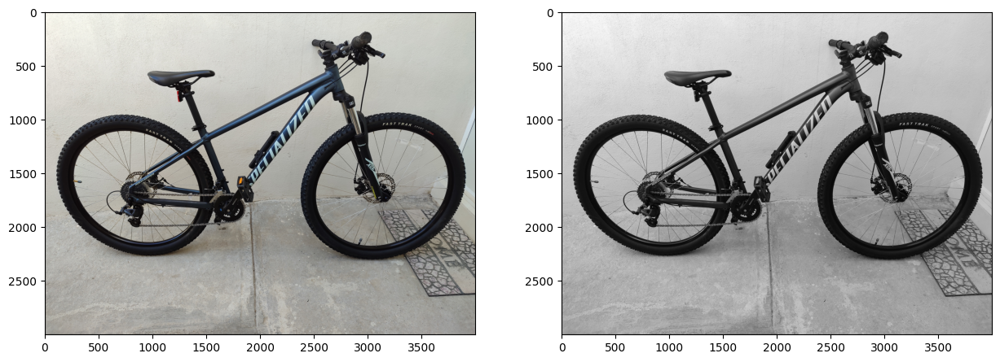

In [275]:
#reading image
img = cv2.imread('data/Bicicleta_1.jpg')
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

In [276]:
#test_image = cv2.pyrDown(img_color)
#test_image = cv2.pyrDown(test_image)
#num_rows, num_cols = test_image.shape[:2]

#rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
#test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))
test_image = cv2.imread('data/Bicicleta_2.jpg')
img_color_test = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
img_gray_test = cv2.cvtColor(test_image, cv2.COLOR_BGR2GRAY)

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

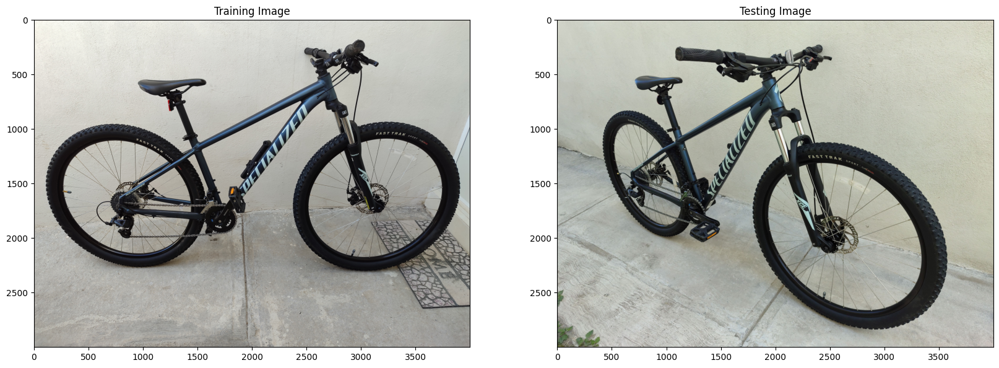

In [277]:
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(img_color)

plots[1].set_title("Testing Image")
plots[1].imshow(img_color_test)

ORB_create() se utiliza para crear un objeto ORB ORB_object.

In [278]:
orb = cv2.ORB_create()

Con la funcion orb.detectAndCompute, detecta los puntos clave y calcula los descriptores de la imagen original e imagen del prueba.

Obtiene los puntos clave con np.copy

Con la funcion drawKeypoints se dibujaran los puntos de interes que obtuvo de la imagen, en este caso, se estan manejando 2, uno con un circulo ( flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) de referencia alrededor del punto y el otro unicamente se colorea de verde los puntos (color = (0, 255, 0))

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  500


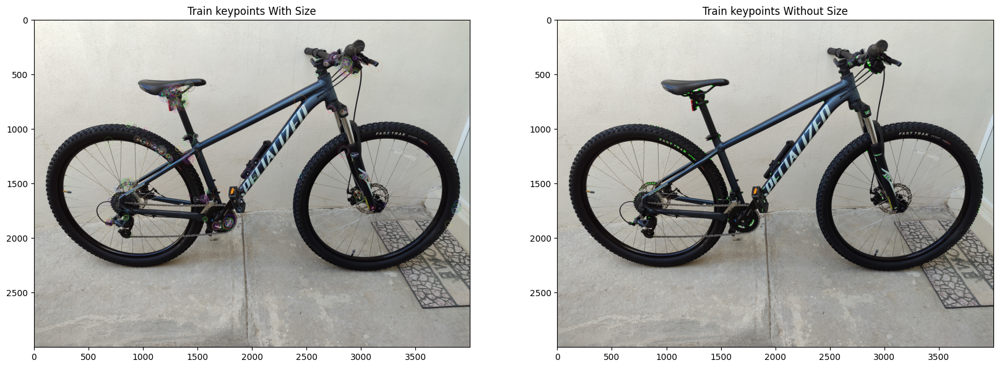

In [279]:
train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(img_color)
keypoints_with_size = np.copy(img_color)

cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

Continuamos, se crea un objeto BFMatcher con medición de distancia cv2.NORM_HAMMING y crossCheck está activado para obtener mejores resultados. Luego usamos el método bf.match() para obtener las mejores coincidencias en dos imágenes. Se clasifican en orden ascendente según sus distancias para que las mejores coincidencias (con distancia baja) aparezcan primero. Luego mostramos los primeros 50 coincidencias.



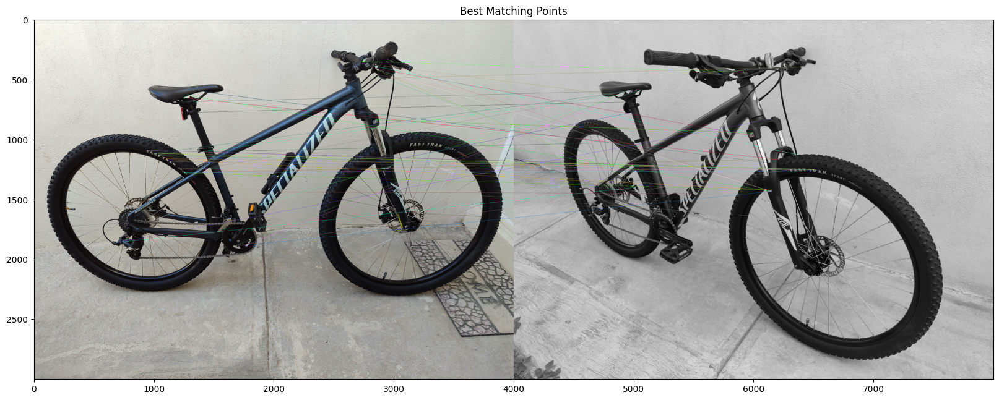


Number of Matching Keypoints Between The Training and Query Images:  137


In [280]:

# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches[:50], test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [20.0, 10.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

### **Comentario :**
Aunque a simple vista parece que realiza un coincidencia de los punto bien, pero al observar las direcciones, parece que no realizo una buena coincidencia, al disminuir los punto principales de 50 a 10, observamos que donde tuvo éxito, fue con las letras de la llanta, pero por el ángulo de la segunda foto, no alcanzan a ser vistas, pero como si están a la vista las de la llanta de enfrente, realiza la coincidencia de las letras que encontró de la llanta trasera, con la llanta frontal

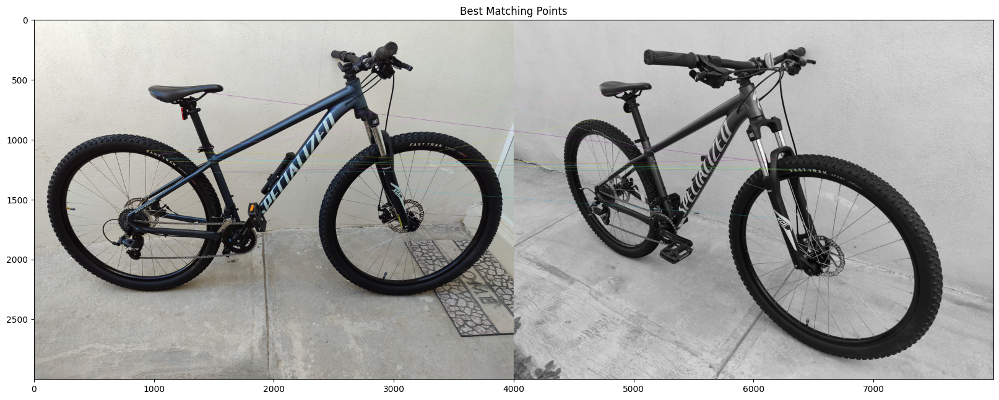


Number of Matching Keypoints Between The Training and Query Images:  137


In [281]:

# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches[:10], test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [20.0, 10.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

## **Imagen 2: Selfie Huasteca con rotacion**

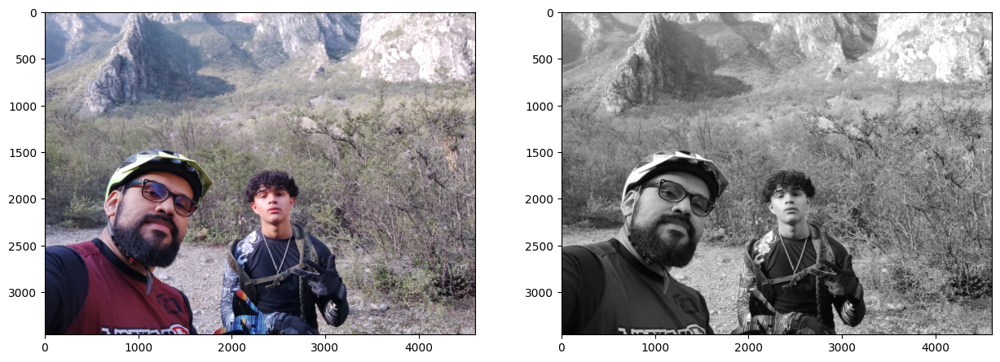

In [282]:
#reading image
#img = cv2.imread('data/Moneda5Pesos3.png')
img = cv2.imread('data/Huasteca1.jpg')
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

In [283]:
test_image = cv2.imread('data/Huasteca2.jpg')
img_color_test = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
img_gray_test = cv2.cvtColor(test_image, cv2.COLOR_BGR2GRAY)

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

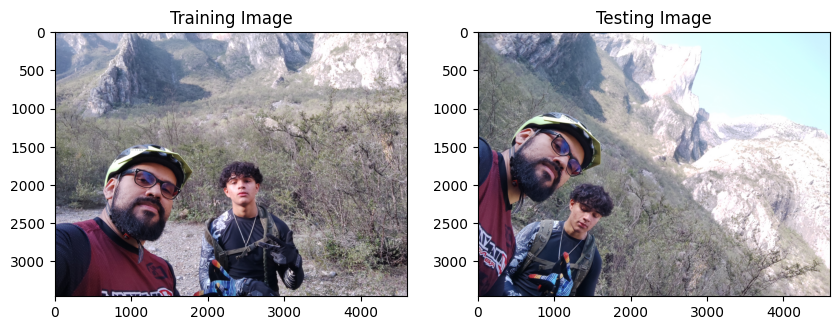

In [284]:
fx, plots = plt.subplots(1, 2, figsize=(10,5))

plots[0].set_title("Training Image")
plots[0].imshow(img_color)

plots[1].set_title("Testing Image")
plots[1].imshow(img_color_test)

In [285]:
orb = cv2.ORB_create()

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  500


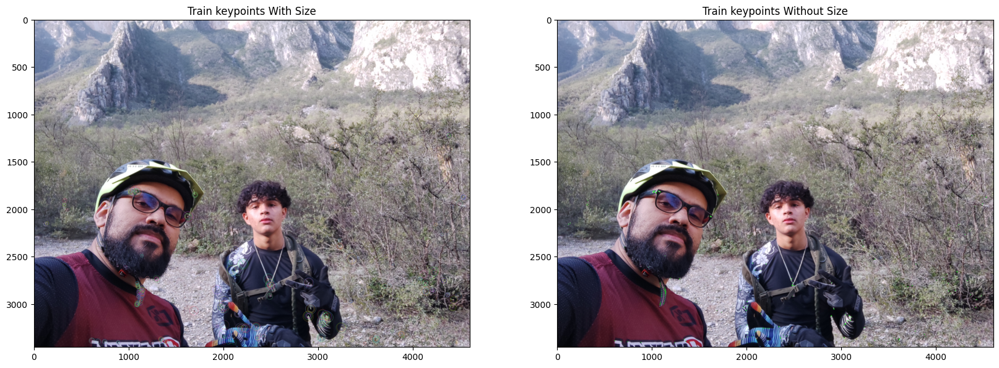

In [286]:
train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(img_color)
keypoints_with_size = np.copy(img_color)

cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

In [287]:

# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [30.0, 20.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

Output hidden; open in https://colab.research.google.com to view.

### **Comentario:**

Podemos observar como el algoritmo realiza la coincidencia de los puntos muy bien en la segunda foto con un ángulo distinto, donde realiza la coincidencia con los lentes letras de la playera, cinta del casco y guante.

# SIFT Matching (Scale Invariant Feature Transform) <a class="anchor" id="sift" ></a>

## **Introduccion**

El algoritmo SIFT (Transformación de características invariantes de escala) es una técnica de visión por computadora que se utiliza para la detección y descripción de características. Detecta puntos o características clave distintivos en una imagen que son resistentes a cambios de escala, rotación y transformaciones afines. SIFT (transformación de características invariantes de escala) funciona identificando puntos clave en función de sus extremos de intensidad local y calculando descriptores que capturan la información de la imagen local alrededor de esos puntos clave. Estos descriptores se pueden utilizar para tareas como la comparación de imágenes, el reconocimiento de objetos y la recuperación de imágenes.

El algoritmo SIFT ayuda a localizar las características locales en una imagen, comúnmente conocidas como " puntos clave " de la imagen. Estos puntos clave son invariantes de escala y rotación que se pueden usar para diversas aplicaciones de visión por computadora, como coincidencia de imágenes, detección de objetos, detección de escenas, etc.

También podemos utilizar los puntos clave generados mediante la visión por computadora SIFT como características de la imagen durante el entrenamiento del modelo. La principal ventaja de las funciones SIFT, de borde es que no se ven afectadas por el tamaño ni la orientación de la imagen.[2]


## **Imagen 1: Bicicleta**

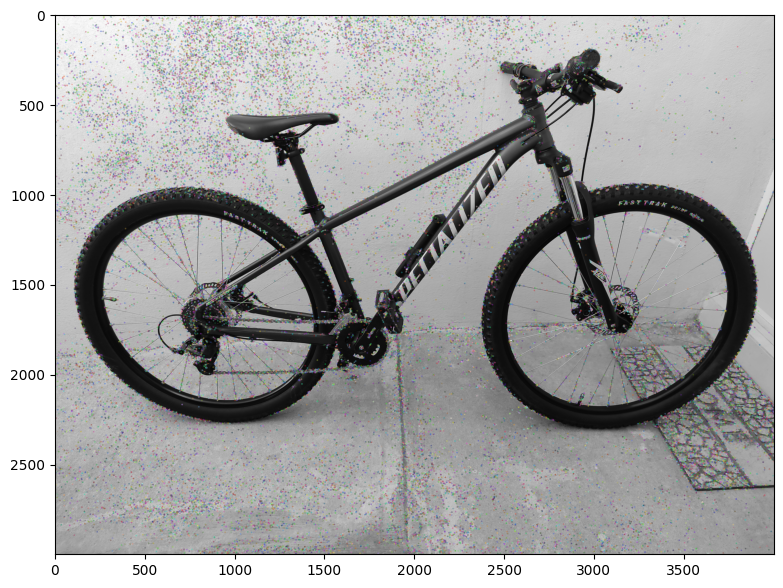

In [314]:
img1 = cv2.imread('data/Bicicleta_1.jpg')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.figure(figsize = (15,7))
plt.imshow(img_1)

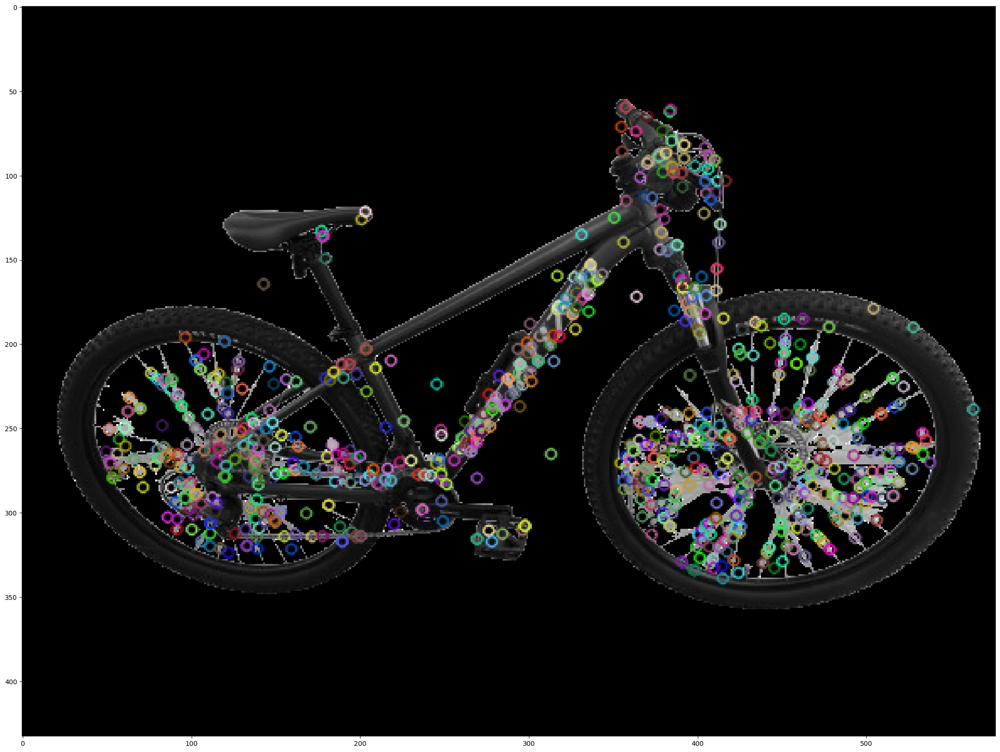

In [289]:
img1 = cv2.imread('data/Bicicleta_1-SinFondo.png')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.imshow(img_1)

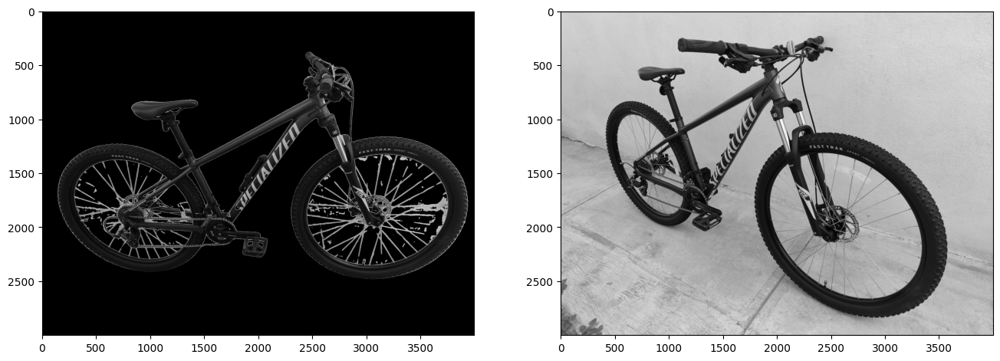

In [290]:
# read images
img1 = cv2.imread('data/Bicicleta_1-SinFondo2.png')
img2 = cv2.imread('data/Bicicleta_2.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(img1, cmap='gray')
ax[1].imshow(img2, cmap='gray')

In [291]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(13442, 39342)

In [292]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.imshow(img3),plt.show()

Output hidden; open in https://colab.research.google.com to view.

### **Comentarios:**
En un principio, la imagen original ocasiona que el algoritmo elija puntos de interés los cuales no lo son para nuestro análisis, por lo que se decidió cambiar la imagen por una sin fondo con menor calidad y tamaño, para que se enfoque en el objeto deseado y no al alrededor, por lo que al final, se observa que realizo la coincidencia principalmente con las letras del cuadro.

## **Imagen 2: Disco**

In [293]:
img1 = cv2.imread('data/Sitra.jpg')
#img1 = cv2.imread('data/Sitraahra.png')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1, None)# size=(16, 16),

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.imshow(img_1)

Output hidden; open in https://colab.research.google.com to view.

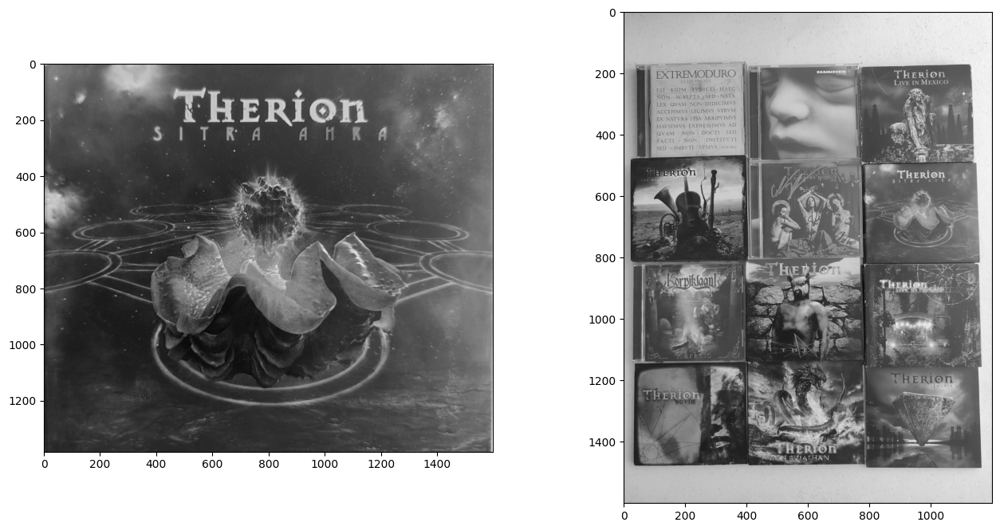

In [294]:
img1 = cv2.imread('data/Sitra.jpg')
img2 = cv2.imread('data/Discos.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(img1, cmap='gray')
ax[1].imshow(img2, cmap='gray')

In [295]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(3140, 11621)

In [296]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)#, k=2
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.imshow(img3),plt.show()

Output hidden; open in https://colab.research.google.com to view.

### **Comentario:**
En este caso, la imagen a buscar es la portada de un disco en una imagen entre otros discos, como la portada tiene detalles muy precisos y únicos, las coincidencias de la imagen son exitosas entre las demás portadas.

## **Imagen 3: Moneda**

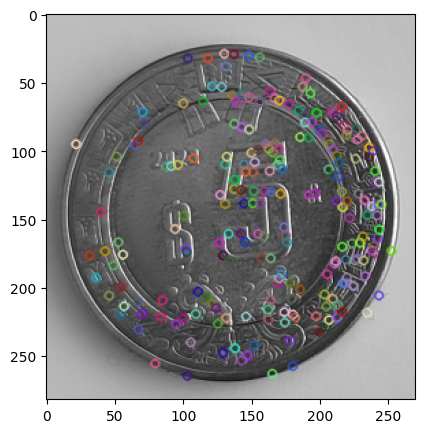

In [297]:
img1 = cv2.imread('data/Moneda5Pesos3.png')
#img1 = cv2.imread('data/Sitraahra.png')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1, None)# size=(16, 16),

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.figure(figsize = (5,5))
plt.imshow(img_1)

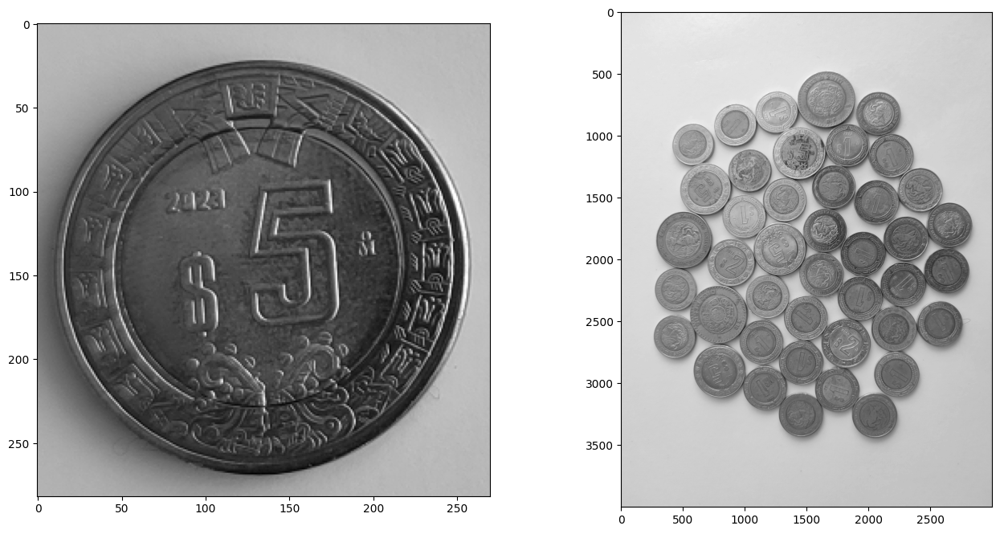

In [298]:
img1 = cv2.imread('data/Moneda5Pesos3.png')
img2 = cv2.imread('data/Monedas.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(img1, cmap='gray')
ax[1].imshow(img2, cmap='gray')

In [299]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(247, 43098)

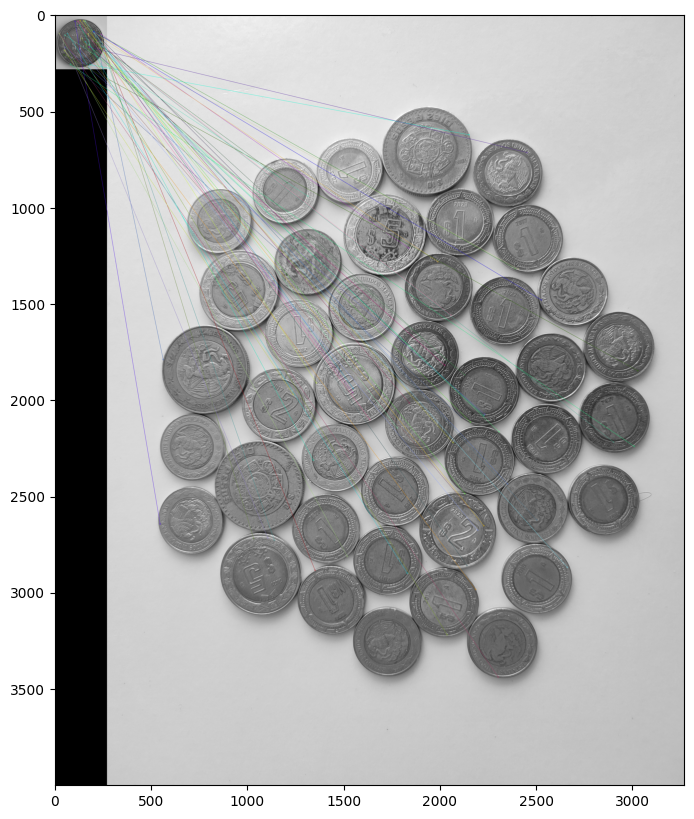

(<matplotlib.image.AxesImage at 0x7cd0bc2a6740>, None)

In [300]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)#, k=2
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.figure(figsize = (15,10))
plt.imshow(img3),plt.show()

### **Comentarios:**

En este caso, se observa que la imagen que se eligió fue la moneda de 5 pesos, para buscar entre las demás monedas, al momento de generar los punto de importancia, se observa que selecciona áreas que al compararlas con el estilo de las imágenes y relieve de las demás monedas, es muy fácil de confundir estas áreas con alguna otra moneda, por esa razón es que las líneas de coincidencia se esparcen en toda la imagen.


## **Imagen 4: Pickup**



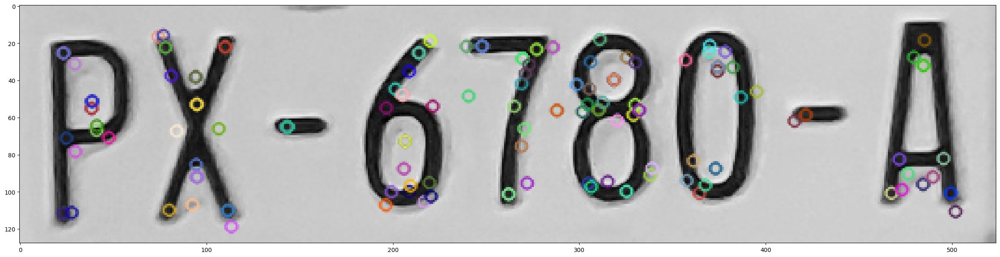

In [301]:
img1 = cv2.imread('data/Placa.png')
#img1 = cv2.imread('data/Sitraahra.png')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1, None)# size=(16, 16),

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.imshow(img_1)

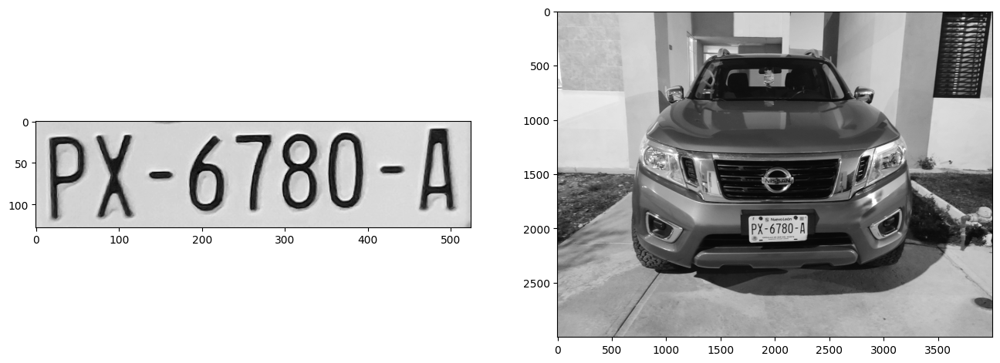

In [302]:
img1 = cv2.imread('data/Placa.png')
img2 = cv2.imread('data/Pickup2.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(img1, cmap='gray')
ax[1].imshow(img2, cmap='gray')

In [303]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(146, 9751)

In [304]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)#, k=2
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches, img2, flags=2)
plt.imshow(img3),plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [305]:
img1 = cv2.imread('data/Placa.png')
img2 = cv2.imread('data/Pickup4.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

#figure, ax = plt.subplots(1, 2, figsize=(16, 8))

#ax[0].imshow(img1, cmap='gray')
#ax[1].imshow(img2, cmap='gray')

In [306]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(146, 21109)

In [307]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)#, k=2
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.imshow(img3),plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [308]:
img1 = cv2.imread('data/Placa.png')
img2 = cv2.imread('data/Pickup5.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

#figure, ax = plt.subplots(1, 2, figsize=(16, 8))

#ax[0].imshow(img1, cmap='gray')
#ax[1].imshow(img2, cmap='gray')

In [309]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(146, 8600)

In [310]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)#, k=2
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.imshow(img3),plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [311]:
img1 = cv2.imread('data/Placa.png')
img2 = cv2.imread('data/Pickup.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

#figure, ax = plt.subplots(1, 2, figsize=(16, 8))

#ax[0].imshow(img1, cmap='gray')
#ax[1].imshow(img2, cmap='gray')

In [312]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(146, 16386)

In [313]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)#, k=2
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.imshow(img3),plt.show()

Output hidden; open in https://colab.research.google.com to view.

### **Comentarios:**

En este último, se buscó la imagen de la placa en las fotografías, en diferentes ángulos e imágenes, donde se pudo localizar la placa con éxito, mientras que el ángulo de la fotográfica va cambiando, podemos ver que las coincidencias empiezan a estar más dispersas como en la última, donde empieza a ver coincidencias con las del ambiente de la imagen y no de la placa.


# **Conclusiones**

Uno de los principales problemas que se observó, es el tamaño de la imagen, que ocasiona que, durante el procesamiento de la imagen para extraer los puntos principales de la imagen, sean muy pequeños estos y sean fácilmente confundibles con otras áreas de la imagen que se desea buscar.

También el hecho del tipo de texturas y estilo del objeto a buscar, si tiene un estilo similar a otros objetos, ocasiona que existan coincidencias donde no se contemplaba.




# **Bibliografia**

[1] geeksforgeeks.org, Recuperado el 25 de Febrero 2024. https://www.geeksforgeeks.org/feature-matching-using-orb-algorithm-in-python-opencv/

[1] Aishwarya Singh. analyticsvidhya. Recuperado el 25 de Febrero 2024. https://www.analyticsvidhya.com/blog/2019/10/detailed-guide-powerful-sift-technique-image-matching-python/
